In [1]:
cd ..

/Users/yanndubois/SSL-Risk-Decomposition


In [2]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
#!rm -rf /Users/yanndubois/.cache/torch/hub/YannDubs_SSL-Risk-Decomposition_main

# Collect all results

In [4]:
import torch
import pandas as pd
from utils.plotting import *
from utils.collect_results import *
from pathlib import Path
import warnings
import logging
import hubconf

metadata_df = hubconf.metadata_df(is_multiindex=False)

 No module named 'clip'


In [5]:
results = load_all_results()
check_missing(results, metadata_df)

Found 461 result files to load.


Missing results for: msn_vitl16_ep600


In [6]:
results = format_approx_results(results, metadata_df, f_replace_arch=f_replace_arch)

Found missing supervised models for:


,pred,seed,arch
0,torch_momlinear_lr0.3_wdec1e-06_ep100_bs256,123,vitb32 cls
1,torch_momlinear_lr0.3_wdec1e-06_ep100_bs256,123,resnet50w64
2,torch_momlinear_lr0.3_wdec1e-06_ep100_bs256,123,vitl16 cls
3,torch_linear_lr0.3_wdec1e-06_ep100_bs256,125,resnet50w64
4,torch_linear_lr0.3_wdec1e-06_ep100_bs256,124,resnet50w64
5,torch_linear_lr0.3_wdec1e-06_ep100_bs256,123,resnet50w64
6,torch_linear_lr0.3_wdec1e-06_ep100_bs256,123,resnet50w4
7,torch_linear_lr0.3_wdec1e-06_ep100_bs256,125,resnet50w16
8,torch_linear_lr0.3_wdec1e-06_ep100_bs256,124,resnet50w16
9,torch_linear_lr0.3_wdec1e-06_ep100_bs256,123,resnet50w16


In [7]:
results = make_risk_decomposition(results, traverse_path=["down","right","down"], is_print=True)

[usability] = [train_train] - [sup_train_train]
[probe_gen] = [train-cmplmnt-ntest_train-sbst-ntest] - [train_train]
[enc_gen] = [train_test] - [train-cmplmnt-ntest_train-sbst-ntest]


In [8]:
base_pred = 'torch_linear_lr0.3_wdec1e-06_ep100_bs256'
results, metadata_df = clean_results(results, metadata_df, predictor=base_pred)

Found negative values:


,agg_risk,usability,enc_gen,probe_gen,approx,train_train
enc,,,,,,
dino_vitb16_extracts,29.630,-0.187,4.624,24.112,1.081,0.894
mugs_vitb16_ep400_extractb,24.782,-2.716,5.280,14.526,7.692,4.976


In [9]:
validate_results(results, metadata_df)

The following results seem suspicously bad:


,agg_risk
enc,
beit_vitb16_pt22k,89.418000
beit_vitl16_pt22k,73.404002
densecl_rn50_200ep_mmselfsup,55.194002
mocov2_rn50_ep200,50.206000
mocov2_rn50_vissl,52.370000
odc_rn50_440ep_mmselfsup,52.600002
simclr_resnet50_dnone_e100_m2_headtnonesnone,50.286001
simsiam_rn50_bs256_ep100,65.763998
simsiam_rn50_bs256_ep200_mmselfsup,61.746001


The following models have very different original and evalauted performance:


enc
densecl_rn50_200ep_mmselfsup          18.534002
infomin_rn50_200ep                    14.601999
infomin_rn50_800ep                    11.832000
jigsaw_rn50                           11.338001
jigsaw_rn50_in22k                     16.225999
mae_vitb16                            14.024001
mae_vith14                            15.788001
mae_vitl16                            11.452000
mocov1_rn50_ep200                     28.100001
mocov2_rn50_ep200                     17.906000
mocov2_rn50_ep800                     15.173999
mocov2_rn50_vissl                     18.770000
relativeloc_rn50_70ep_mmselfsup       26.848001
rotnet_rn50_in1k                      13.036665
rotnet_rn50_in22k                     11.038001
simsiam_rn50_bs256_ep100              34.063998
simsiam_rn50_bs256_ep200_mmselfsup    31.586001
simsiam_rn50_bs512_ep100              34.100003
speccl_bs384_ep100                    32.707998
dtype: float64

The following results have some nan:


,agg_risk,usability,enc_gen,probe_gen,approx,train_train
enc,,,,,,
clip_rn50x16,18.570,NaN,2.203,3.718,NaN,12.649
clip_rn50x4,21.791,NaN,2.185,3.252,NaN,16.354
clip_rn50x64,16.086,NaN,2.025,5.814,NaN,8.248
dino_vits8_last,24.988,NaN,3.574,8.739,NaN,12.675
mae_vith14,39.188,NaN,4.116,0.819,NaN,34.253
msn_vitb4_ep300,20.346,NaN,5.418,2.028,NaN,12.900
msn_vitl7_ep200,22.168,NaN,6.050,5.241,NaN,10.877
simclr_rn50w4,32.166,NaN,3.574,2.385,NaN,26.207
swav_rn50w4,24.978,NaN,3.190,4.493,NaN,17.295


In [10]:
# filter out values that are suspiciously bad
to_del = ["clip_vitl14","clip_vitl14_px336","msn_vitl16_ep600"]
to_keep = [i for i in results.index.get_level_values("enc") if i not in to_del]
results = results.loc[to_keep]
metadata_df = metadata_df.loc[to_keep]

### Understanding features

In [11]:
X,y=prepare_sklearn(results, metadata_df)

In [15]:
from pandas_profiling import ProfileReport
from pathlib import Path
profile = ProfileReport()

path = Path("notebooks")/"profile.pp"
if path.exists():
    profile.load(path)
else:
    profile.to_html()
    profile.dump(path)
profile

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
results["agg_risk"].var()**0.5

13.204579355138792

## Global analysis : all features

### Hyperparameter tuning

your data has very few wors => need to evalaute with cross validation and can perform extensive hyperparameter tuning

TODO: need to save!

In [13]:
X,y=prepare_sklearn(results, metadata_df)

In [14]:
# %%time
# best_sk_xgb, sk_xgb_study = tune_sk_xgb(X, y)

In [15]:
%%time
best_std_xgb, std_xgb_study = tune_std_xgb(X, y, is_force_exact=True)

``multivariate`` option is an experimental feature. The interface can change in the future.
``group`` option is an experimental feature. The interface can change in the future.
Progress bar is experimental (supported from v1.2.0). The interface can change in the future.


  0%|          | 0/50 [00:00<?, ?it/s]

Final 30-fold cv rmse=5.567936840954551
CPU times: user 2h 12min 47s, sys: 39min 8s, total: 2h 51min 56s
Wall time: 9h 4min 55s


In [16]:
#plot_optuna(study)

In [17]:
best_model = best_std_xgb

### Feature importance

R2: 0.9993499375321538. RMSE: 0.3354281810090366


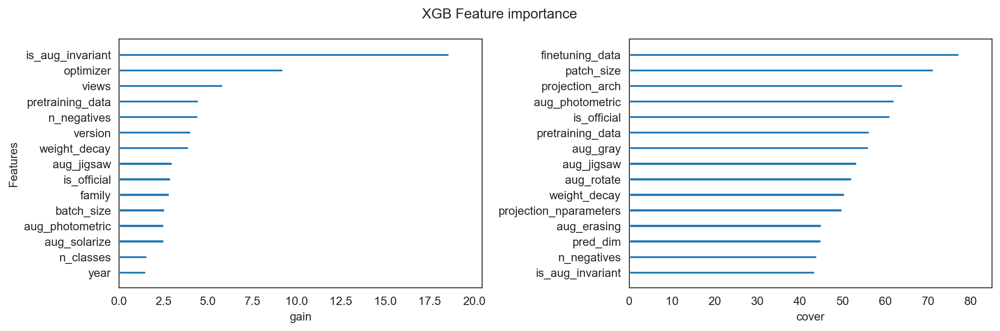

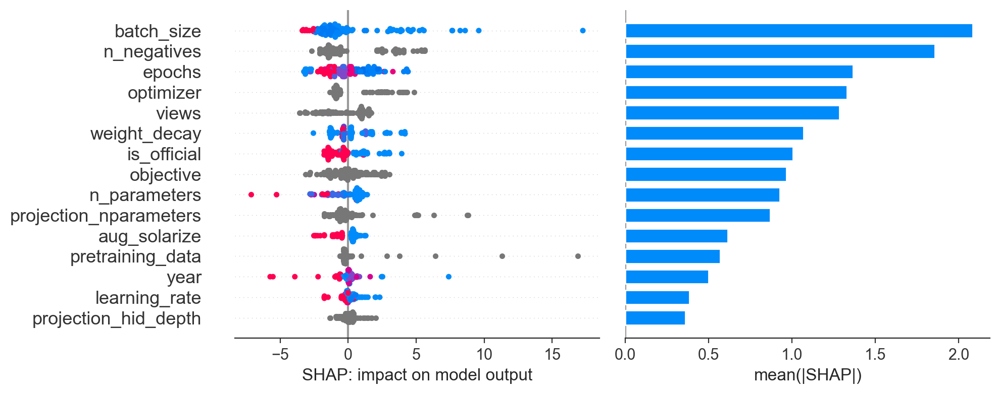

swav_rn50_ep400


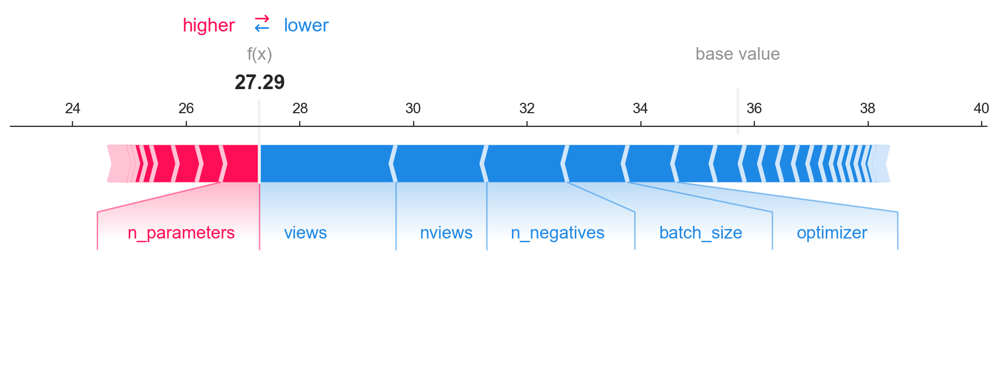

None

dino_vitS16


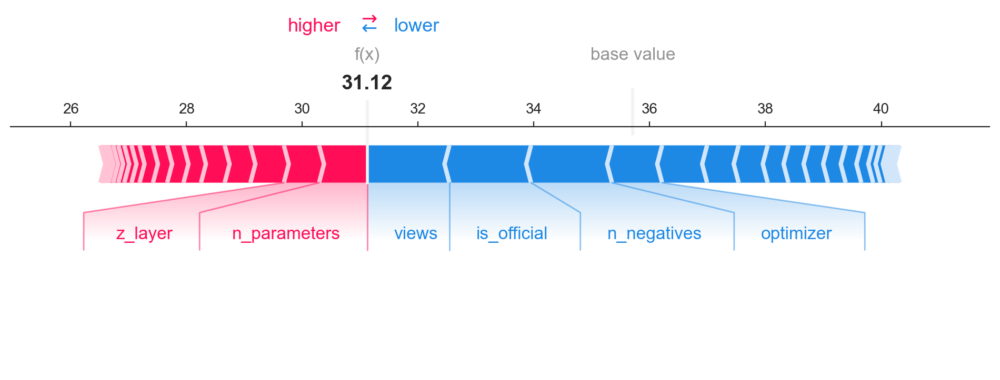

None

dino_rn50


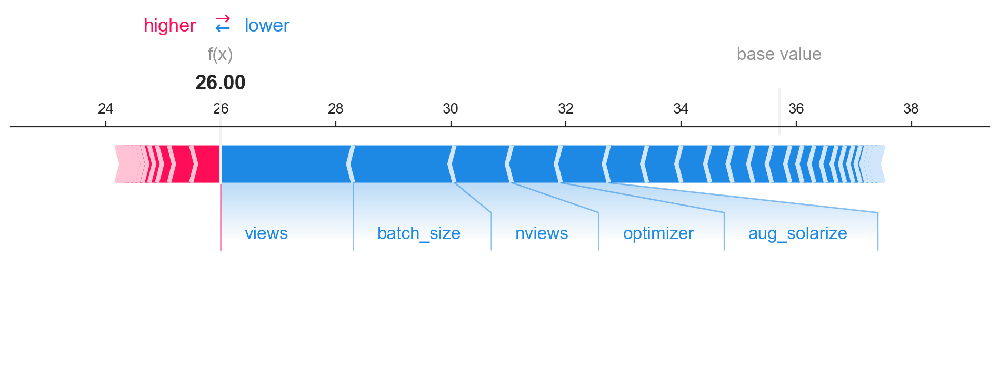

None

dissl_resnet50_d8192_e400_m6


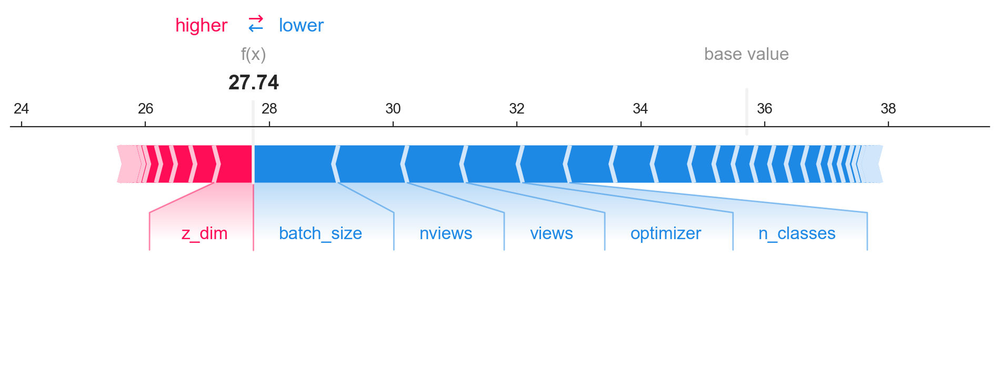

None

dissl_resnet50_dNone_e400_m6


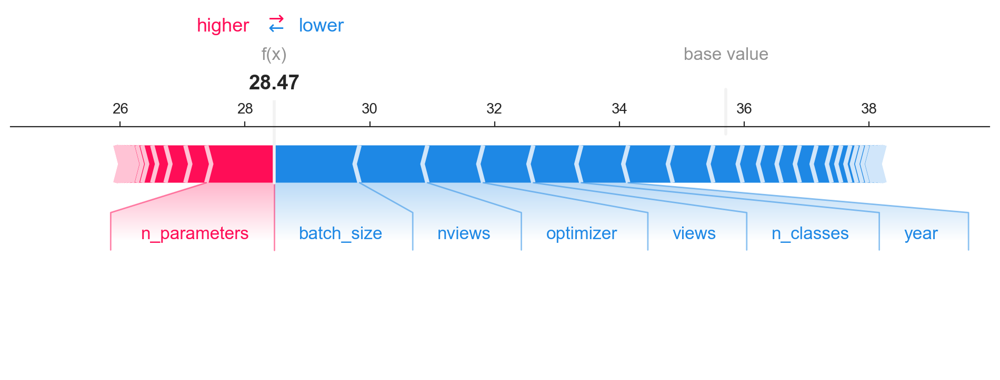

None

dissl_resnet50_dNone_e400_m2


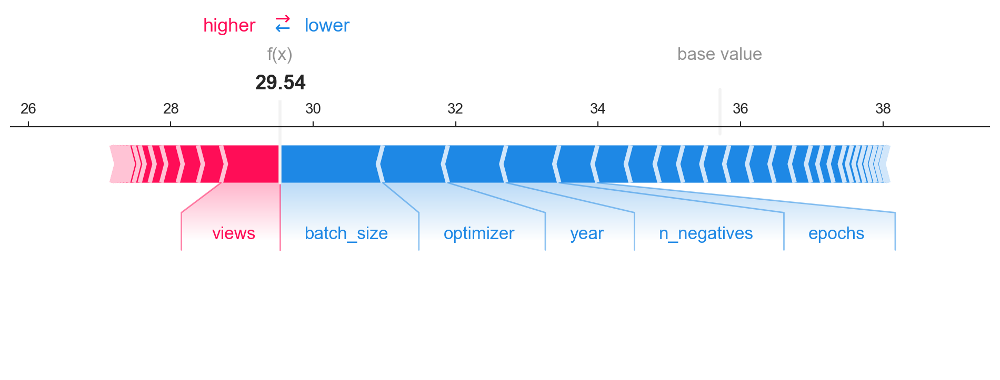

None

dissl_resnet50_dNone_e100_m2


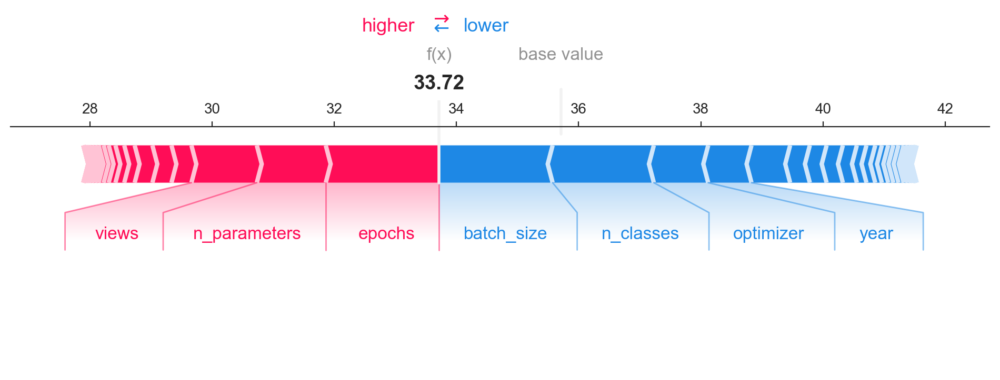

None

In [18]:
report_xgboost(best_model, X, y)

In [19]:
# from BorutaShap import BorutaShap

# rf = xgb.XGBRegressor(enable_categorical=True, tree_method="hist", subsample=0.7, max_depth=3,
#                        n_estimators=1000, colsample_bytree=0.3)

# Feature_Selector = BorutaShap(model=rf,
#                               importance_measure='shap',
#                               classification=False)

# Feature_Selector.fit(X=X, y=y, n_trials=100, sample=False,
#                      train_or_test = 'test', normalize=True, verbose=True)

## Global analysis : standard features

In [17]:
features_to_keep= ["objective","architecture",'patch_size',"epochs",'batch_size','pretraining_data','projection_arch', 
                   'finetuning_data', "nviews"] # add 'z_dim'

X,y=prepare_sklearn(results, metadata_df,
                    features_to_keep=features_to_keep,
                    round_dict = dict(epochs=100, batch_size=256)
                   )

In [18]:
%%time
subset_xgb, subset_study = tune_std_xgb(X, y, is_force_exact=True)

``multivariate`` option is an experimental feature. The interface can change in the future.
``group`` option is an experimental feature. The interface can change in the future.
Progress bar is experimental (supported from v1.2.0). The interface can change in the future.


  0%|          | 0/50 [00:00<?, ?it/s]

Final 30-fold cv rmse=5.634301092613585
CPU times: user 1h 11min 48s, sys: 20min 57s, total: 1h 32min 46s
Wall time: 27min 3s


R2: 0.984356039584777. RMSE: 1.6454904084126252


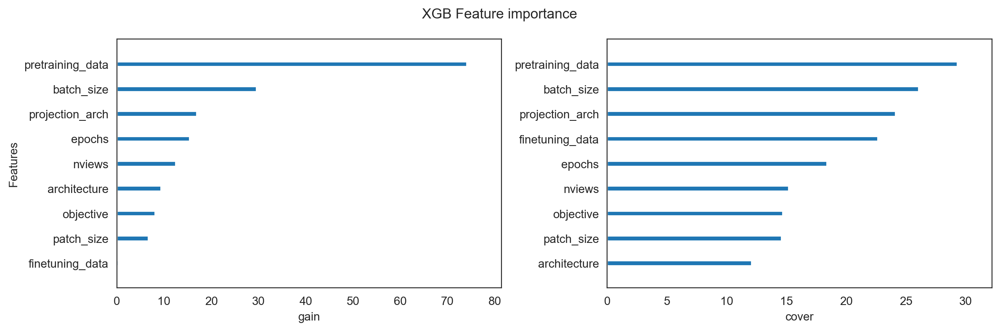

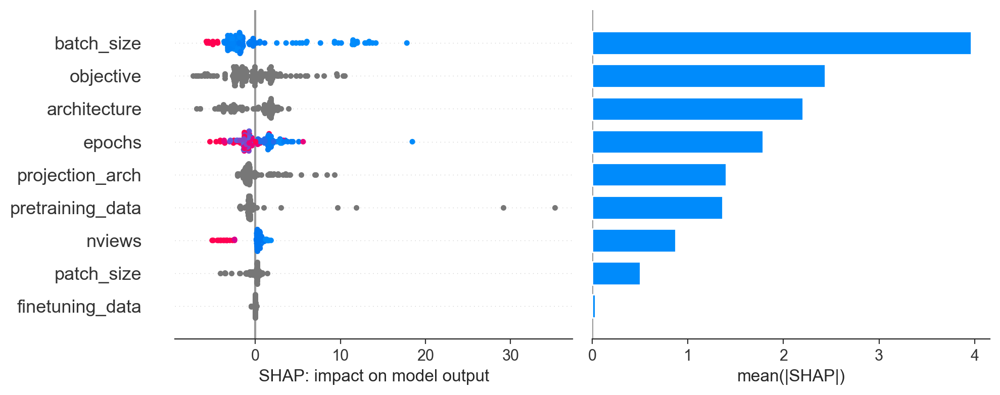

swav_rn50_ep400


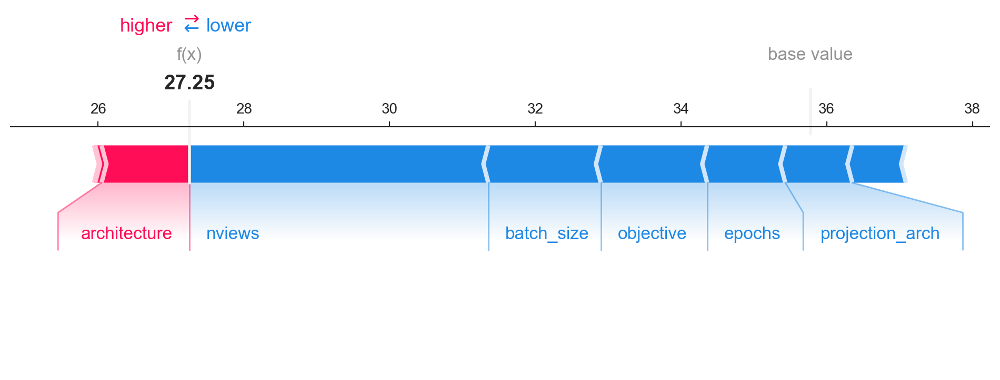

None

dino_vitS16


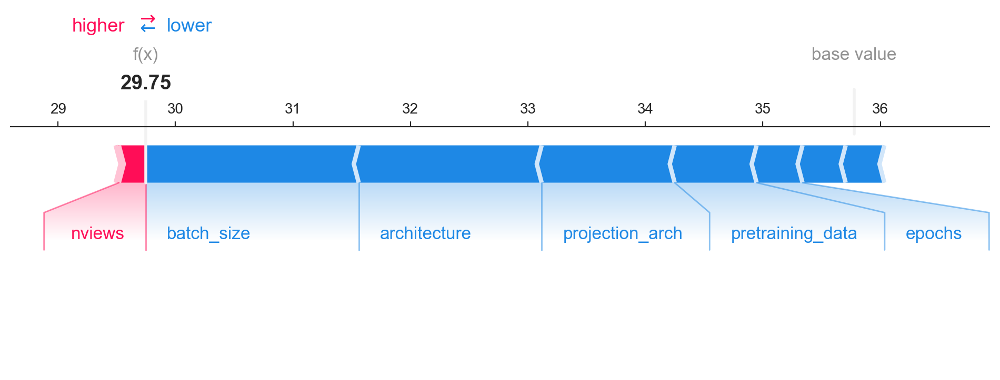

None

dino_rn50


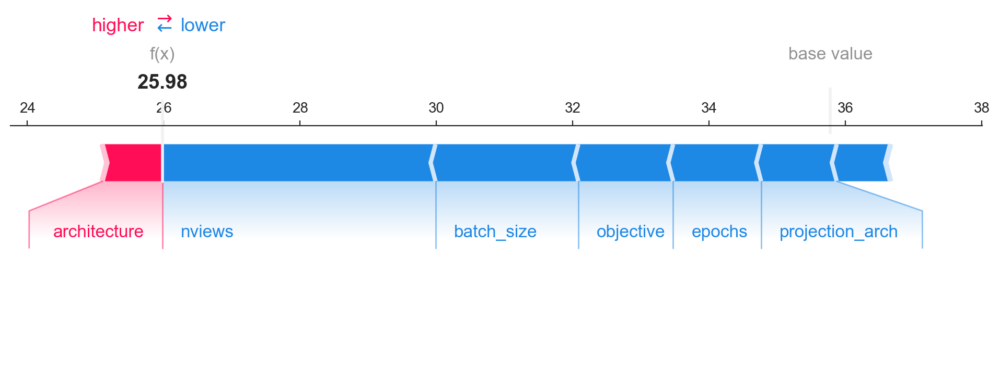

None

dissl_resnet50_d8192_e400_m6


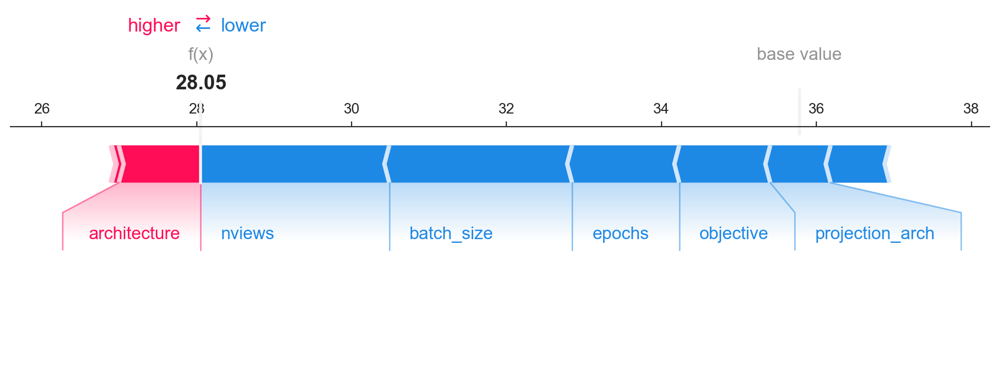

None

dissl_resnet50_dNone_e400_m6


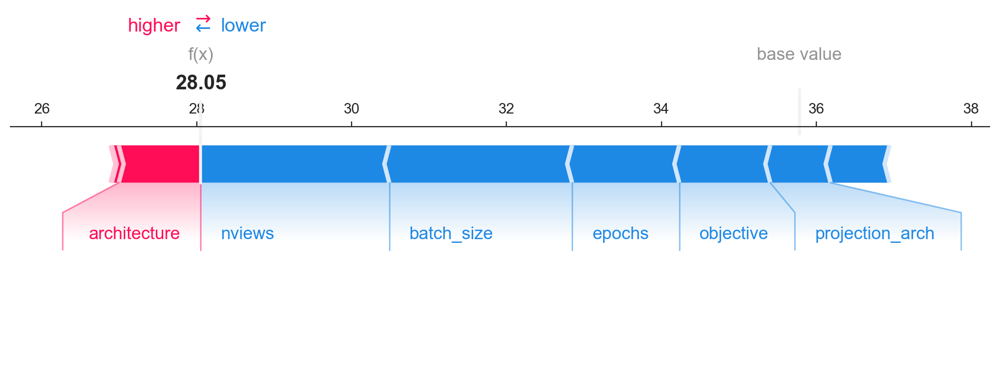

None

dissl_resnet50_dNone_e400_m2


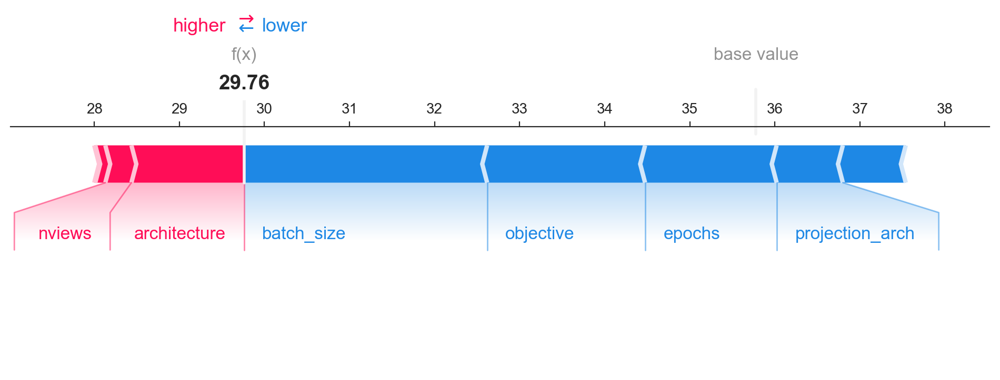

None

dissl_resnet50_dNone_e100_m2


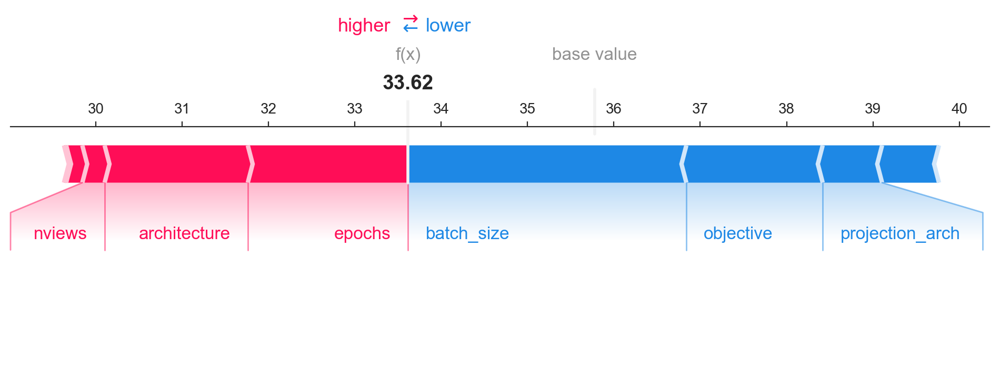

None

In [19]:
report_xgboost(subset_xgb, X, y)

## Global analysis : subset features

In [20]:
features_to_keep= ["ssl_mode","architecture",'patch_size','z_dim','z_layer',"epochs",'batch_size', 'pretraining_data',
                     'projection_arch', 'finetuning_data', "aug_photometric", "nviews", #'year'
                  ] # objective, year, aug_solarize

X,y=prepare_sklearn(results, metadata_df,
                    features_to_keep=features_to_keep,
                    round_dict = dict(epochs=100, batch_size=256)
                   )

In [21]:
%%time
subset_xgb, subset_study = tune_std_xgb(X, y, is_force_exact=True)

``multivariate`` option is an experimental feature. The interface can change in the future.
``group`` option is an experimental feature. The interface can change in the future.
Progress bar is experimental (supported from v1.2.0). The interface can change in the future.


  0%|          | 0/50 [00:00<?, ?it/s]

Final 30-fold cv rmse=6.599187940808392
CPU times: user 1h 23min 16s, sys: 23min 16s, total: 1h 46min 32s
Wall time: 28min 25s


R2: 0.9779454762162816. RMSE: 1.9537583326334982


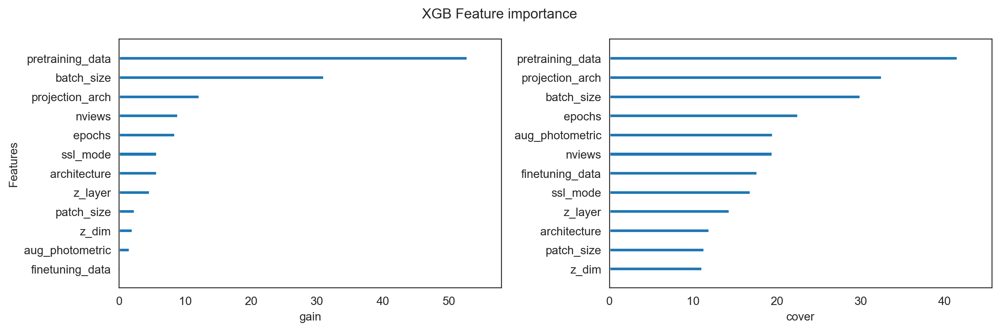

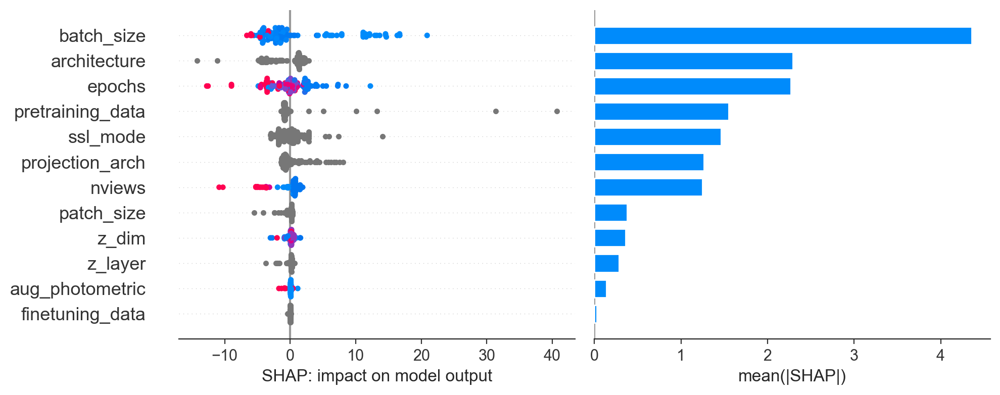

swav_rn50_ep400


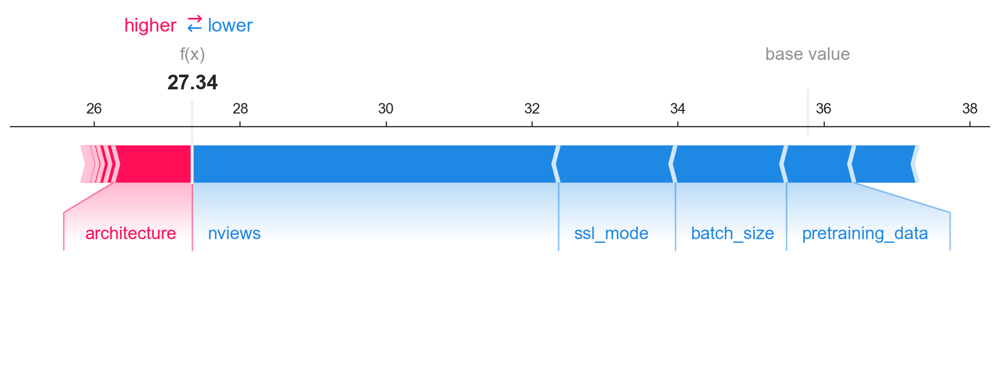

None

dino_vitS16


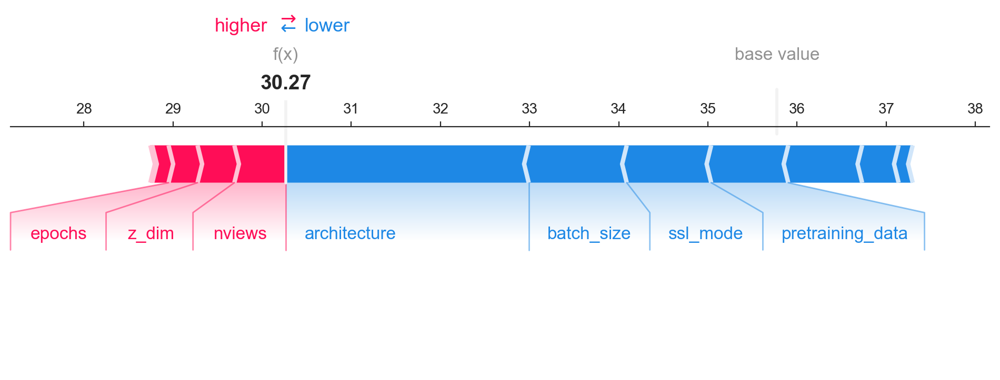

None

dino_rn50


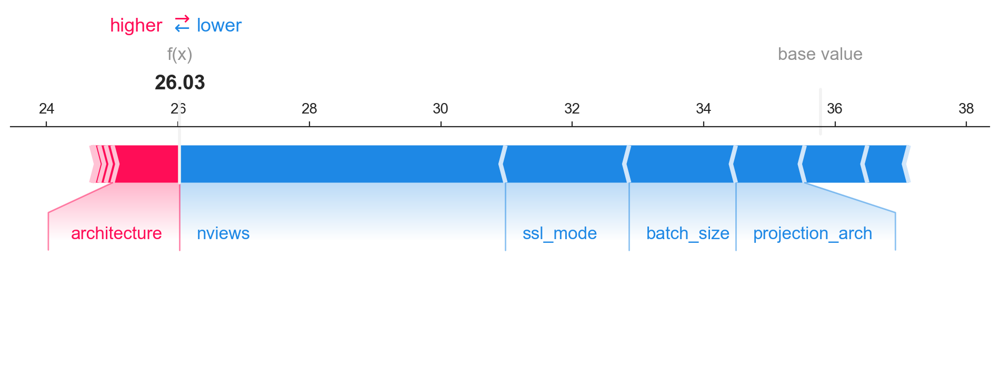

None

dissl_resnet50_d8192_e400_m6


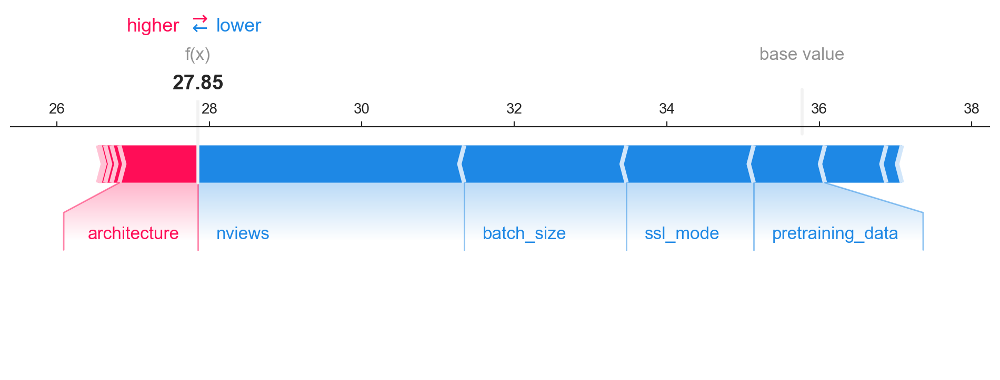

None

dissl_resnet50_dNone_e400_m6


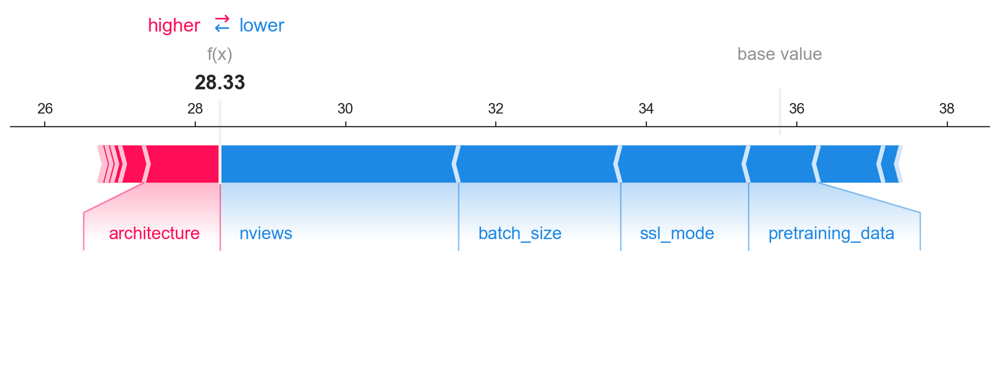

None

dissl_resnet50_dNone_e400_m2


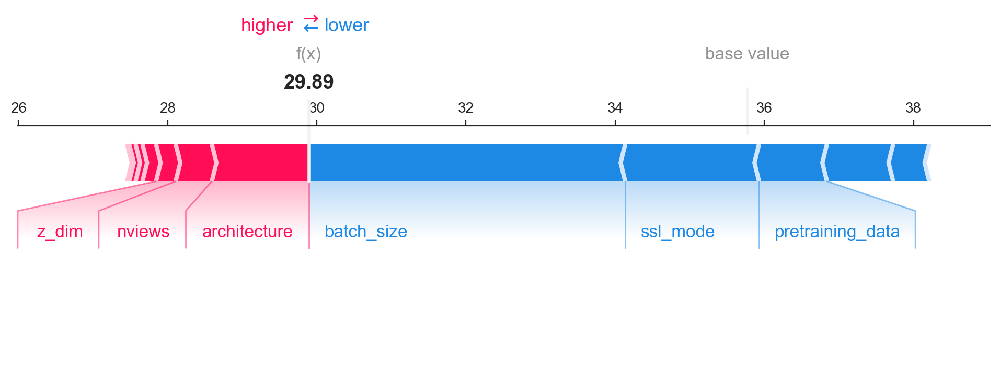

None

dissl_resnet50_dNone_e100_m2


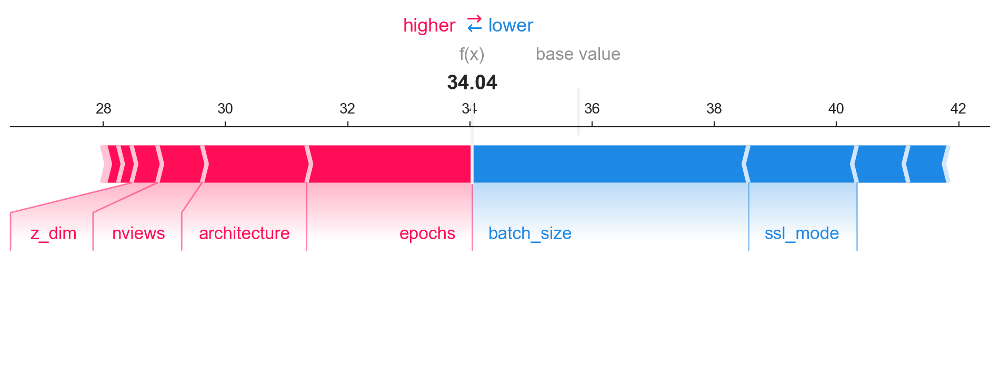

None

In [22]:
report_xgboost(subset_xgb, X, y)

In [1]:
#!rm -rf /Users/yanndubois/.cache/torch/hub/YannDubs_SSL-Risk-Decomposition_main
import torch
e,p = torch.hub.load("YannDubs/SSL-Risk-Decomposition:main","msn_vitl16_ep600",force_reload=True)
e=e.cpu()
e(torch.randn(1,3,224,224).cpu()).shape

Downloading: "https://github.com/YannDubs/SSL-Risk-Decomposition/zipball/main" to /Users/yanndubois/.cache/torch/hub/main.zip
 No module named 'clip'


torch.Size([1, 1024])